In [1]:
# !mamba install xarray-datatree -y

In [30]:
import matplotlib.pyplot as plt
import gcsfs
from xmip.preprocessing import combined_preprocessing
import xarray as xr
import numpy as np
from xarrayutils.plotting import shaded_line_plot
xr.set_options(keep_attrs=True)
%matplotlib inline
%config InlineBackend.figure_format='retina'
plt.rcParams['figure.figsize'] = (10,5)
# this is weird. I believe that there is something in xarrayutils is messing with this?

In [2]:
from dask_gateway import Gateway
gateway = Gateway()

# # close existing clusters
# open_clusters = gateway.list_clusters()
# print(list(open_clusters))
# if len(open_clusters)>0:
#     for c in open_clusters:
#         cluster = gateway.connect(c.name)
#         cluster.shutdown()  
options = gateway.cluster_options()
options.environment = dict(
    DASK_DISTRIBUTED__SCHEDULER__WORKER_SATURATION="1.0"
)

# Create a cluster with those options
cluster = gateway.new_cluster(options)
client = cluster.get_client()
cluster.scale(40)
client

Connection method: Cluster object,Cluster type: dask_gateway.GatewayCluster
Dashboard: /services/dask-gateway/clusters/prod.80eca99bc905427c823582f1586d3306/status,


In [3]:
import datatree
datatree.__version__

'0.0.10'

In [4]:
from xmip.utils import google_cmip_col
# we could do all of this with pure pandas on the underlying csv file
col = google_cmip_col()

In [5]:
fail_cases = ['AWI-CM-1-1-MR', 'AWI-ESM-1-1-LR', 'CanESM5'] #TODO: investigate later what is going on here
source_ids = [si for si in col.df['source_id'].unique() if si not in fail_cases]

In [6]:
query = dict(
    source_id = source_ids,
    experiment_id = ['historical', 'ssp126', 'ssp245', 'ssp585'],
    grid_label='gn',
)
cat = col.search(
    **query,
    variable_id='tos',
    member_id=['r1i1p1f1', 'r2i1p1f1', 'r3i1p1f1','r4i1p1f1', 'r5i1p1f1'], #
    table_id='Omon'
)
kwargs = dict(preprocess=combined_preprocessing, xarray_open_kwargs=dict(use_cftime=True), aggregate=False)
ddict = cat.to_dataset_dict(**kwargs)


--> The keys in the returned dictionary of datasets are constructed as follows:
	'activity_id.institution_id.source_id.experiment_id.member_id.table_id.variable_id.grid_label.zstore.dcpp_init_year.version'


In [7]:
cat_area = col.search(
    **query,
    table_id='Ofx',
    variable_id='areacello',
)
ddict_area = cat_area.to_dataset_dict(**kwargs)


--> The keys in the returned dictionary of datasets are constructed as follows:
	'activity_id.institution_id.source_id.experiment_id.member_id.table_id.variable_id.grid_label.zstore.dcpp_init_year.version'


In [8]:
from xmip.postprocessing import match_metrics
ddict_w_area = match_metrics(ddict, ddict_area, 'areacello', print_statistics=True) 

/srv/conda/envs/notebook/lib/python3.10/site-packages/xmip/postprocessing.py:675: UserWarning: No matching metrics found for areacello
  warnings.warn(f"No matching metrics found for {mv}")
/srv/conda/envs/notebook/lib/python3.10/site-packages/xmip/postprocessing.py:675: UserWarning: No matching metrics found for areacello
  warnings.warn(f"No matching metrics found for {mv}")
/srv/conda/envs/notebook/lib/python3.10/site-packages/xmip/postprocessing.py:675: UserWarning: No matching metrics found for areacello
  warnings.warn(f"No matching metrics found for {mv}")
/srv/conda/envs/notebook/lib/python3.10/site-packages/xmip/postprocessing.py:675: UserWarning: No matching metrics found for areacello
  warnings.warn(f"No matching metrics found for {mv}")
/srv/conda/envs/notebook/lib/python3.10/site-packages/xmip/postprocessing.py:675: UserWarning: No matching metrics found for areacello
  warnings.warn(f"No matching metrics found for {mv}")
/srv/conda/envs/notebook/lib/python3.10/site-packa

Processed 320 datasets.
Exact matches:{'areacello': 0}
Other matches:{'areacello': 277}
No match found:{'areacello': 43}


In [9]:
from xmip.postprocessing import concat_members
import dask
with dask.config.set(**{'array.slicing.split_large_chunks': True}):
    ddict_combined_members = concat_members(ddict_w_area)

/srv/conda/envs/notebook/lib/python3.10/site-packages/xmip/postprocessing.py:157: UserWarning: ScenarioMIP.CAS.FGOALS-f3-L.ssp245.r2i1p1f1.Omon.gn.none.tos failed to combine with :Can not use auto rechunking with object dtype. We are unable to estimate the size in bytes of object data
  warnings.warn(f"{cmip6_dataset_id(ds)} failed to combine with :{e}")
/srv/conda/envs/notebook/lib/python3.10/site-packages/xmip/postprocessing.py:157: UserWarning: ScenarioMIP.MIROC.MIROC6.ssp245.r2i1p1f1.Omon.gn.none.tos failed to combine with :Can not use auto rechunking with object dtype. We are unable to estimate the size in bytes of object data
  warnings.warn(f"{cmip6_dataset_id(ds)} failed to combine with :{e}")
/srv/conda/envs/notebook/lib/python3.10/site-packages/xarray/core/indexing.py:1374: PerformanceWarning: Slicing is producing a large chunk. To accept the large
chunk and silence this warning, set the option
    >>> with dask.config.set(**{'array.slicing.split_large_chunks': False}):
    .

## xarray-datatree

In [10]:
from datatree import DataTree

In [11]:
# create a path: dataset dictionary, where the path is based on each datasets attributes
tree_dict = {
    f"{ds.source_id}/{ds.experiment_id}/":ds for ds in ddict_combined_members.values()
}

dt = DataTree.from_dict(tree_dict)
dt

DataTree('None', parent=None)
├── DataTree('IPSL-CM6A-LR')
│   ├── DataTree('ssp126')
│   │       Dimensions:         (member_id: 4, y: 332, x: 362, dcpp_init_year: 1,
│   │                            time: 1032, vertex: 4, bnds: 2)
│   │       Coordinates: (12/13)
│   │           lat_verticies   (y, x, vertex) float32 -84.21 -84.21 -84.21 ... 50.11 50.11
│   │           lon_verticies   (y, x, vertex) float32 72.5 72.5 72.5 ... 73.0 72.95 73.0
│   │           lat             (y, x) float32 -84.21 -84.21 -84.21 ... 50.23 50.01 50.01
│   │           lon             (y, x) float32 72.5 73.5 74.5 75.5 ... 73.04 73.0 72.99
│   │         * time            (time) object 2015-01-16 12:00:00 ... 2100-12-16 12:00:00
│   │           time_bounds     (time, bnds) object 2015-01-01 00:00:00 ... 2101-01-01 00...
│   │           ...              ...
│   │         * x               (x) int64 0 1 2 3 4 5 6 7 ... 355 356 357 358 359 360 361
│   │           lon_bounds      (bnds, y, x) float32 72.5 73.5 74.5 ... 73.03 73.0 72.97
│   │           lat_bounds      (bnds, y, x) float32 -84.21 -84.21 -84.21 ... 50.04 50.04
│   │         * member_id       (member_id) object 'r2i1p1f1' 'r4i1p1f1' ... 'r1i1p1f1'
│   │         * dcpp_init_year  (dcpp_init_year) float64 nan
│   │           areacello       (member_id, dcpp_init_year, y, x) float32 dask.array<chunksize=(1, 1, 332, 362), meta=np.ndarray>
│   │       Dimensions without coordinates: vertex, bnds
│   │       Data variables:
│   │           area            (member_id, y, x) float32 dask.array<chunksize=(1, 332, 362), meta=np.ndarray>
│   │           tos             (member_id, dcpp_init_year, time, y, x) float32 dask.array<chunksize=(1, 1, 247, 332, 362), meta=np.ndarray>
│   │       Attributes: (12/50)
│   │           Conventions:                      CF-1.7 CMIP-6.2
│   │           EXPID:                            ssp126
│   │           NCO:                              "4.6.0"
│   │           activity_id:                      ScenarioMIP
│   │           branch_method:                    standard
│   │           branch_time_in_child:             0.0
│   │           ...                               ...
│   │           intake_esm_attrs:source_id:       IPSL-CM6A-LR
│   │           intake_esm_attrs:experiment_id:   ssp126
│   │           intake_esm_attrs:table_id:        Omon
│   │           intake_esm_attrs:variable_id:     tos
│   │           intake_esm_attrs:grid_label:      gn
│   │           intake_esm_attrs:_data_format_:   zarr
│   ├── DataTree('ssp585')
│   │       Dimensions:         (member_id: 4, y: 332, x: 362, dcpp_init_year: 1,
│   │                            time: 1032, vertex: 4, bnds: 2)
│   │       Coordinates: (12/13)
│   │           lat_verticies   (y, x, vertex) float32 -84.21 -84.21 -84.21 ... 50.11 50.11
│   │           lon_verticies   (y, x, vertex) float32 72.5 72.5 72.5 ... 73.0 72.95 73.0
│   │           lat             (y, x) float32 -84.21 -84.21 -84.21 ... 50.23 50.01 50.01
│   │           lon             (y, x) float32 72.5 73.5 74.5 75.5 ... 73.04 73.0 72.99
│   │         * time            (time) object 2015-01-16 12:00:00 ... 2100-12-16 12:00:00
│   │           time_bounds     (time, bnds) object 2015-01-01 00:00:00 ... 2101-01-01 00...
│   │           ...              ...
│   │         * x               (x) int64 0 1 2 3 4 5 6 7 ... 355 356 357 358 359 360 361
│   │           lon_bounds      (bnds, y, x) float32 72.5 73.5 74.5 ... 73.03 73.0 72.97
│   │           lat_bounds      (bnds, y, x) float32 -84.21 -84.21 -84.21 ... 50.04 50.04
│   │         * member_id       (member_id) object 'r2i1p1f1' 'r4i1p1f1' ... 'r3i1p1f1'
│   │         * dcpp_init_year  (dcpp_init_year) float64 nan
│   │           areacello       (member_id, dcpp_init_year, y, x) float32 dask.array<chunksize=(1, 1, 332, 362), meta=np.ndarray>
│   │       Dimensions without coordinates: vertex, bnds
│   │       Data variables:
│   │           area            (member_id, y, x) float32 dask.array<c

In [12]:
dt.nbytes / 1e9  # size in GB

235.849371536

In [13]:
# TODO: I want to check that all experiments for a given model have 'areacello' How to do that in a smart datatree way?

In [14]:
# find a single member that is in all 3 scenarios
dt_single_member = DataTree()
for model_name, model in dt.children.items():
    member_id_values = []
    has_no_area = 0
    for experiment_name, experiment in model.children.items():
        ds = experiment.ds
        # print(ds)
        if 'areacello' in ds:
            member_id_values.append(set(ds.member_id.data))  
        else:
            has_no_area += 1
    
    if has_no_area == 0:
        # find the intersection of all values
        # print(member_id_values)
        full_members = set(member_id_values[0]).intersection(*member_id_values)
        if len(full_members)>0:
            # sort and take the first one
            pick_member = sorted(full_members)[0]
            dt_single_member[model_name] = model.sel(member_id=pick_member)
        else:
            print(f"{model_name} did not have a single member that is in all experiments")
    else:
        print(f"Not all experiments for {model_name} have area coords. Skipping")

Not all experiments for CAMS-CSM1-0 have area coords. Skipping
Not all experiments for GISS-E2-1-H have area coords. Skipping
Not all experiments for NESM3 have area coords. Skipping
Not all experiments for IITM-ESM have area coords. Skipping
Not all experiments for BCC-CSM2-MR have area coords. Skipping
Not all experiments for BCC-ESM1 have area coords. Skipping
Not all experiments for GISS-E2-1-G have area coords. Skipping
Not all experiments for GISS-E2-1-G-CC have area coords. Skipping


In [15]:
# average temperature globally
def global_mean_sst(ds):
    return ds.tos.weighted(ds.areacello.fillna(0)).mean(['x', 'y'], keep_attrs=True).persist() 
    # load here to have data in memory (TODO: Remove for the blog post, how can we handle this more elegantly?)
    # see https://github.com/xarray-contrib/datatree/issues/188
    
#TODO: I think this could really profit from submitting the datasets all to a common dask graph (instead of looping over them). 

timeseries = dt_single_member.map_over_subtree(global_mean_sst)
timeseries

DataTree('None', parent=None)
├── DataTree('IPSL-CM6A-LR')
│   ├── DataTree('ssp126')
│   │       Dimensions:         (time: 1032, dcpp_init_year: 1)
│   │       Coordinates:
│   │         * time            (time) object 2015-01-16 12:00:00 ... 2100-12-16 12:00:00
│   │           member_id       <U8 'r1i1p1f1'
│   │         * dcpp_init_year  (dcpp_init_year) float64 nan
│   │       Data variables:
│   │           tos             (dcpp_init_year, time) float32 dask.array<chunksize=(1, 247), meta=np.ndarray>
│   ├── DataTree('ssp585')
│   │       Dimensions:         (time: 1032, dcpp_init_year: 1)
│   │       Coordinates:
│   │         * time            (time) object 2015-01-16 12:00:00 ... 2100-12-16 12:00:00
│   │           member_id       <U8 'r1i1p1f1'
│   │         * dcpp_init_year  (dcpp_init_year) float64 nan
│   │       Data variables:
│   │           tos             (dcpp_init_year, time) float32 dask.array<chunksize=(1, 120), meta=np.ndarray>
│   ├── DataTree('ssp245')
│   │       Dimensions:         (time: 1032, dcpp_init_year: 1)
│   │       Coordinates:
│   │         * time            (time) object 2015-01-16 12:00:00 ... 2100-12-16 12:00:00
│   │           member_id       <U8 'r1i1p1f1'
│   │         * dcpp_init_year  (dcpp_init_year) float64 nan
│   │       Data variables:
│   │           tos             (dcpp_init_year, time) float32 dask.array<chunksize=(1, 120), meta=np.ndarray>
│   └── DataTree('historical')
│           Dimensions:         (time: 1980, dcpp_init_year: 1)
│           Coordinates:
│             * time            (time) object 1850-01-16 12:00:00 ... 2014-12-16 12:00:00
│               member_id       <U8 'r1i1p1f1'
│             * dcpp_init_year  (dcpp_init_year) float64 nan
│           Data variables:
│               tos             (dcpp_init_year, time) float32 dask.array<chunksize=(1, 251), meta=np.ndarray>
├── DataTree('NorCPM1')
│   └── DataTree('historical')
│           Dimensions:         (time: 1980, dcpp_init_year: 1)
│           Coordinates:
│             * time            (time) object 1850-01-16 12:00:00 ... 2014-12-16 12:00:00
│               member_id       <U8 'r1i1p1f1'
│             * dcpp_init_year  (dcpp_init_year) float64 nan
│           Data variables:
│               tos             (dcpp_init_year, time) float32 dask.array<chunksize=(1, 206), meta=np.ndarray>
├── DataTree('GFDL-ESM4')
│   ├── DataTree('historical')
│   │       Dimensions:         (time: 1980, dcpp_init_year: 1)
│   │       Coordinates:
│   │         * time            (time) object 1850-01-16 12:00:00 ... 2014-12-16 12:00:00
│   │           member_id       <U8 'r1i1p1f1'
│   │         * dcpp_init_year  (dcpp_init_year) float64 nan
│   │       Data variables:
│   │           tos             (dcpp_init_year, time) float32 dask.array<chunksize=(1, 64), meta=np.ndarray>
│   ├── DataTree('ssp245')
│   │       Dimensions:         (time: 1032, dcpp_init_year: 1)
│   │       Coordinates:
│   │         * time            (time) object 2015-01-16 12:00:00 ... 2100-12-16 12:00:00
│   │           member_id       <U8 'r1i1p1f1'
│   │         * dcpp_init_year  (dcpp_init_year) float64 nan
│   │       Data variables:
│   │           tos             (dcpp_init_year, time) float32 dask.array<chunksize=(1, 64), meta=np.ndarray>
│   ├── DataTree('ssp126')
│   │       Dimensions:         (time: 1032, dcpp_init_year: 1)
│   │       Coordinates:
│   │         * time            (time) object 2015-01-16 12:00:00 ... 2100-12-16 12:00:00
│   │           member_id       <U8 'r1i1p1f1'
│   │         * dcpp_init_year  (dcpp_init_year) float64 nan
│   │       Data variables:
│   │           tos             (dcpp_init_year, time) float32 dask.array<chunksize=(1, 64), meta=np.ndarray>
│   └── DataTree('ssp585')
│           Dimensions:         (time: 1032, dcpp_init_year: 1)
│           Coordinates:
│             * time            (time) object 2015-01-16 12:00:00 ... 2100-12-16 12:00:00
│               member_id       <U8 'r1i1p1f1'
│    

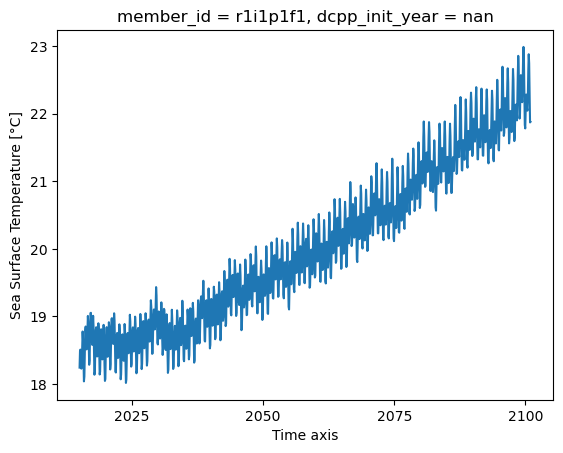

In [16]:
timeseries['/IPSL-CM6A-LR/ssp585'].ds['tos'].plot()

In [17]:
# from datatree import open_datatree
# timeseries.to_zarr('cmip_timeseries')  # or netcdf, with any group structure
# roundtrip = open_datatree('cmip_timeseries', engine="zarr")
# roundtrip

In [19]:
anomaly = DataTree()

def get_ref_value(ds):
    return ds.sel(time=slice('1950','1980')).mean('time')

for model_name, model in timeseries.children.items():
    if 'historical' in model:
        # model-specific base period
        base_period = get_ref_value(model["historical"].ds)
        anomaly[model_name] = model - base_period   # subtree - Dataset
    else:
        print(f"No historical run found for {model_name}")

No historical run found for CAS-ESM2-0
No historical run found for FGOALS-f3-L
No historical run found for FGOALS-g3
No historical run found for NorESM2-MM


In [20]:
# # reorder the levels of the Datatree (does not work as easy as I though)
# anomaly_reordered = DataTree()
# for model_name, model in anomaly.children.items():
#     for experiment_name, experiment in model.children.items():
#         ds = experiment.ds
#         anomaly_reordered[experiment_name][model_name] = ds

In [27]:
experiment_dict = {k:[] for k in ['historical','ssp126', 'ssp245', 'ssp585']}

for model_name, model in anomaly.children.items():
    for experiment_name, experiment in model.children.items():
        ds = experiment.ds
        # replace the time dimension
        start_date = ds.time.data[0]
        new_time = xr.cftime_range(f"{start_date.year}-{start_date.month:02}", freq='1MS', periods=len(ds.time))
        ds_new_cal = ds.assign_coords(time=new_time)
        ds_new_cal = ds_new_cal.load()
        
        experiment_dict[experiment_name].append(ds_new_cal)

# concatenate all models for a given experiment
plot_dict = {k:xr.concat(ds_lst, dim='source_id') for k, ds_lst in experiment_dict.items()}

In [28]:
# add observations
store = 'https://ncsa.osn.xsede.org/Pangeo/pangeo-forge/HadISST-feedstock/hadisst.zarr'
ds_obs = xr.open_dataset(store, engine='zarr', chunks={}).rename({'sst':'tos'}).convert_calendar('standard', use_cftime=True)
ds_obs = ds_obs.where(abs(ds_obs.tos)<50)
area = np.cos(np.deg2rad(ds_obs.latitude)) * 110e3 **2
ds_obs_ts = ds_obs.weighted(area).mean(['longitude', 'latitude'])
ds_obs_anomaly = ds_obs_ts - get_ref_value(ds_obs_ts)

# add to plot_dict
plot_dict['observations'] = ds_obs_anomaly.expand_dims(['source_id', 'dcpp_init_year']).load()

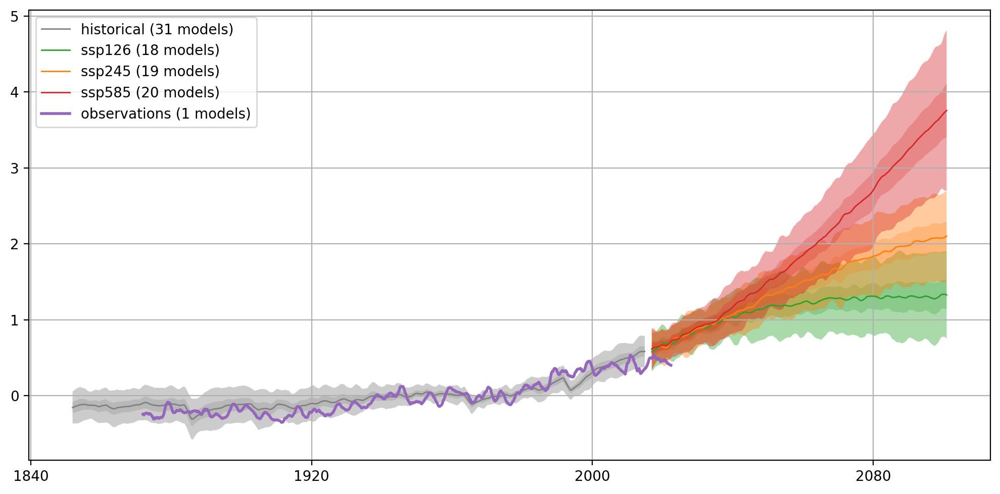

In [33]:
fig, ax = plt.subplots()

color_dict = {'historical':'0.5', 'ssp245': 'C1', 'ssp585':'C3', 'ssp126':'C2', 'observations':'C4'}


for experiment, ds in plot_dict.items():
    color = color_dict[experiment]
    smooth = ds['tos'].sel(time=slice(None, '2100')).rolling(time=2*12).mean().squeeze('dcpp_init_year')
    lw = 2 if experiment=='observations' else 1
    shaded_line_plot(smooth, 'source_id', ax=ax, line_kwargs=dict(color=color, label=f"{experiment} ({len(ds.source_id)} models)", lw=lw))
plt.legend(loc=2);
plt.grid()
plt.tight_layout()

# TODO: 
- 'blend' the historical run with the scenarios, to avoid that gap. 
- Make zoom in inset plot. Or just a hvplot, where you can zoom in?

![multires](carbonplan.gif)

(creds Joe Hamman and the CarbonPlan team)

### want to help? 

Visit https://github.com/xarray-contrib/datatree

@TomNicholas

<img src="Untitled.svg" width=200 height=200 />